# import and preprapration

In [2]:
#%%
import pandas as pd
import base64
import requests
from dotenv import load_dotenv
import os
from sentence_transformers import SentenceTransformer, util
from PIL import Image
import json
import matplotlib.pyplot as plt
from umap import UMAP
from hdbscan import HDBSCAN


/Users/alessiogandelli/dev/uni/image-clustering/.venv/lib/python3.9/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


In [13]:
load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")
model = SentenceTransformer('clip-ViT-B-32')

img_path = '/Users/alessiogandelli/dev/uni/image-clustering/data/imgs'
img_files = [os.path.join(img_path, filename) for filename in os.listdir(img_path)]

let's see the images first


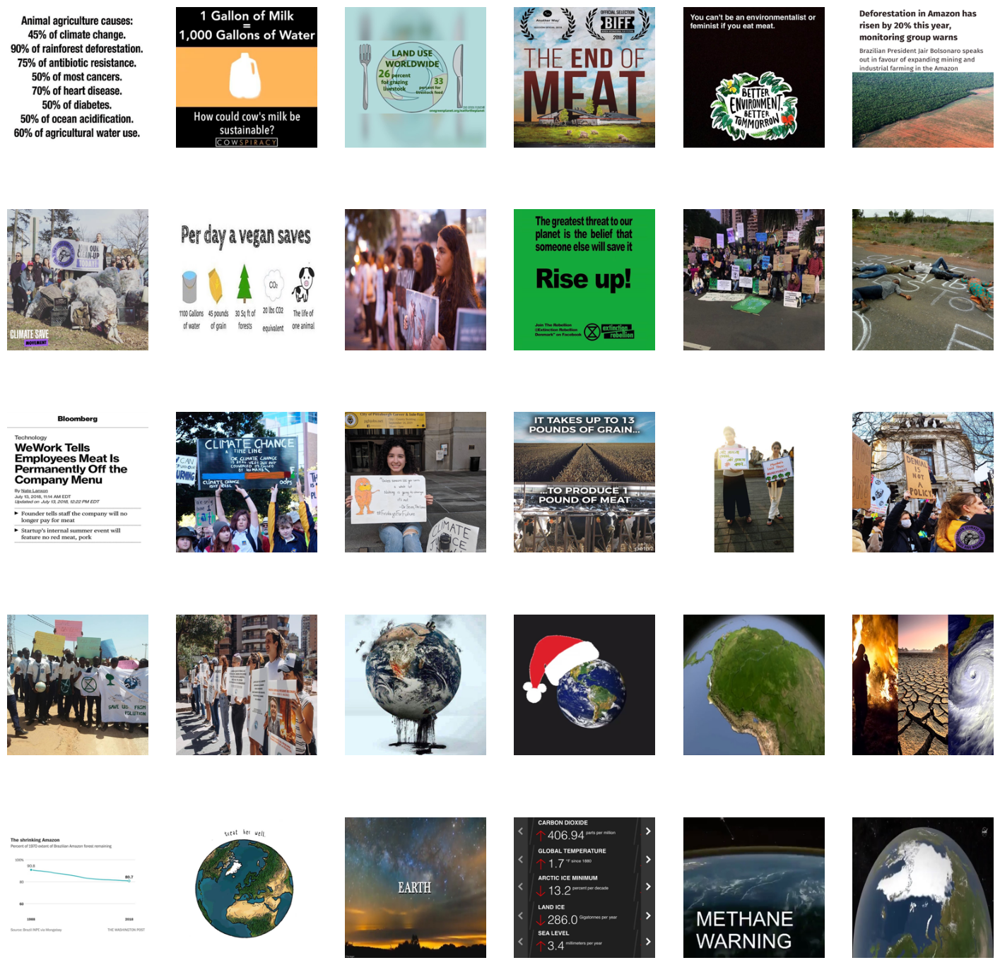

In [30]:
#5x5 image grid with 30 images
images = [Image.open(img_file).resize((224,224)) for img_file in img_files]
fig, axs = plt.subplots(5, 6, figsize=(18, 18))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(images[i])
    ax.axis('off')




# Image embeddings
image embeddings usinc clip model are created 

In [14]:
images_to_embed = [Image.open(filepath) for filepath in img_files]
img_emb = model.encode(images_to_embed, show_progress_bar=False)

now let's reduce the dimensionality using UMAP to 5 dimension and let's use HDSCAN to cluster the images, a limitation is the number of images we have 

In [15]:
reduced_embeddings = UMAP(n_components=5).fit_transform(img_emb)

clustering =  HDBSCAN(
    min_cluster_size=2,  # Lowered to accommodate small clusters
    min_samples=2,  # Close to min_cluster_size for consistency
    cluster_selection_method='eom',  # Excess of Mass for flexibility
    prediction_data=True  # Allows for soft clustering and outlier scores
).fit(reduced_embeddings)

In [18]:
labels = clustering.labels_

In [20]:
labels

array([2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 0, 0,
       0, 0, 2, 0, 0, 0, 0, 0])

now let's do a quick visualization of the points in 2D using UMAP

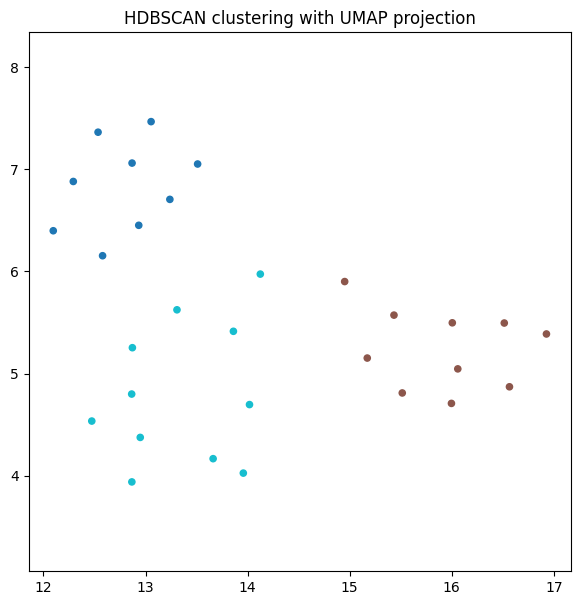

In [25]:
embeddings2d = UMAP(n_components=2).fit_transform(img_emb)

plt.figure(figsize=(7, 7))
plt.scatter(embeddings2d[:, 0], embeddings2d[:, 1], c=labels, cmap='tab10', s=20)
plt.gca().set_aspect('equal', 'datalim')
plt.title('HDBSCAN clustering with UMAP projection')
plt.show()


let's visualize the 3 clusters we have

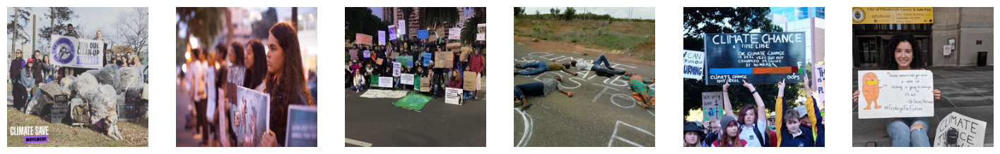

In [33]:
#plot only images with label =1 
images = [Image.open(img_file).resize((224,224)) for img_file in img_files]
#labels is a of the cluster of each image, devide the images in clusters
# get images with label 1
images_label1 = [images[i] for i in range(len(images)) if labels[i] == 1]

fig, axs = plt.subplots(1, 6, figsize=(18, 18))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(images_label1[i])
    ax.axis('off')


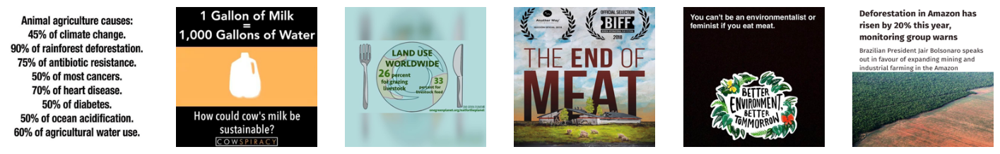

In [34]:
#same for label 2
images_label2 = [images[i] for i in range(len(images)) if labels[i] == 2]

fig, axs = plt.subplots(1, 6, figsize=(18, 18))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(images_label2[i])
    ax.axis('off')

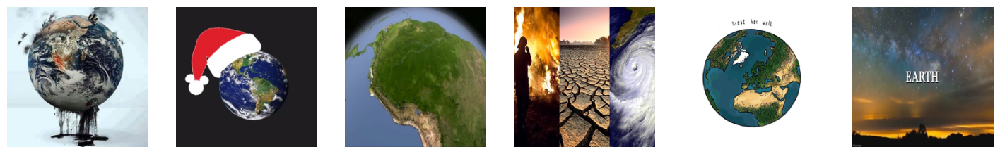

In [35]:
#same for label 0
images_label0 = [images[i] for i in range(len(images)) if labels[i] == 0]

fig, axs = plt.subplots(1, 6, figsize=(18, 18))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(images_label0[i])
    ax.axis('off')

# advanced 
the images contains text and maybe it can be used to cluster the images both with the image, let's use gpt4-o to 

In [37]:
headers = {
    "Content-Type": "application/json",
    "Authorization": f"Bearer {api_key}"
}

prompt = """I have an image, and I would like to perform the following tasks:

        1. Generate a Caption: Provide a brief description of what is depicted in the image.
        2. Extract Text: Identify and extract any text present within the image.
        3. Generate Tags: Provide 3 relevant tags or keywords that describe the image content.

        format the answer as a json object with the following structure:
        {
            "caption": "A brief description of the image content.",
            "text": "Any text identified within the image.",
            "tags": ["tag1", "tag2", "tag3"]
        }
        """

labeled_images = []

def encode_image(image_path):
  with open(image_path, "rb") as image_file:
    return base64.b64encode(image_file.read()).decode('utf-8')
  


In [38]:
for i in range(len(img_files)):
   

    image_path = img_files[i]

    base64_image = encode_image(image_path) # Getting the base64 string


    payload = {
        "model": "gpt-4o",
        "response_format": { "type": "json_object" },
        "messages": [
            {
            "role": "user",
            "content": [
                {
                "type": "text",
                "text": prompt
                },
                {
                "type": "image_url",
                "image_url": {
                    "url": f"data:image/jpeg;base64,{base64_image}"
                }
                }
            ]
            }
        ],
        "max_tokens": 300
    }
    response = requests.post("https://api.openai.com/v1/chat/completions", headers=headers, json=payload)


    parsed_response = response.json()['choices'][0]['message']['content']
    json_string = json.loads(parsed_response)
    json_string['embedding'] = img_emb[i].tolist()
    json_string['image_path'] = image_path
    labeled_images.append(json_string)



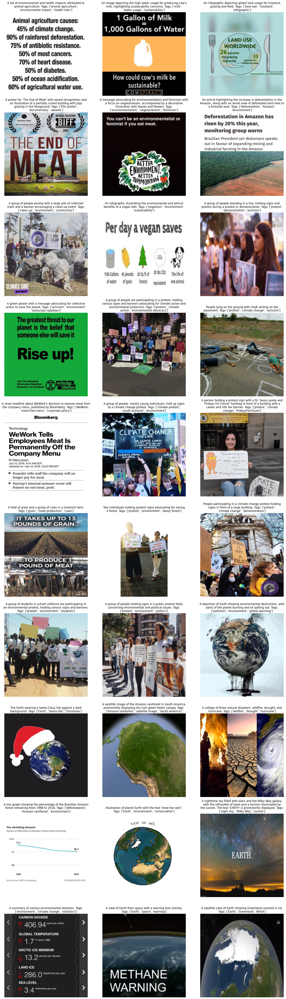

In [69]:
# Assuming img_files and labeled_images are already defined
import textwrap
images = [Image.open(img_file).resize((224, 224)) for img_file in img_files]

# Create a figure with 10 rows and 3 columns
fig, axs = plt.subplots(10, 3, figsize=(18, 60))

for i, ax in enumerate(axs.flatten()):
    ax.imshow(images[i])
    ax.axis('off')
    # Add the caption as the title
    #title = labeled_images[i]['caption']
    title = f"{labeled_images[i]['caption']}\nTags: {labeled_images[i]['tags']}"
    # Wrap the title after 60 characters
    title = textwrap.fill(title, 60)
    ax.set_title(title)

plt.tight_layout()
plt.show()


In [70]:
labels

array([2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 0, 0,
       0, 0, 2, 0, 0, 0, 0, 0])

In [72]:
tags = [labeled_images[i]['tags'] for i in range(len(labeled_images))] 

In [73]:
tags

[['animal agriculture', 'environmental impact', 'health risks'],
 ['milk', 'water usage', 'sustainability'],
 ['land use', 'livestock', 'infographic'],
 ['film poster', 'documentary', 'awards'],
 ['environmentalism', 'vegetarianism', 'feminism'],
 ['deforestation', 'Amazon', 'environment'],
 ['clean-up', 'environment', 'community'],
 ['veganism', 'environment', 'sustainability'],
 ['protest', 'demonstration', 'activism'],
 ['activism', 'environment', 'extinction rebellion'],
 ['protest', 'climate action', 'environmental advocacy'],
 ['protest', 'climate change', 'activism'],
 ['WeWork', 'meat-free menu', 'corporate policy'],
 ['climate protest', 'youth activism', 'environment'],
 ['protest', 'climate change', 'FridaysForFuture'],
 ['grain', 'meat production', 'cows'],
 ['protest', 'environment', 'Aarey forest'],
 ['protest', 'climate change', 'demonstration'],
 ['protest', 'environment', 'students'],
 ['protest', 'environment', 'politics'],
 ['pollution', 'environment', 'global warming

In [75]:
lebeled_tags = zip(labels, tags)


In [76]:
# get tags for each cluster
cluster_tags = {}
for label, tag in lebeled_tags:
    if label not in cluster_tags:
        cluster_tags[label] = []
    cluster_tags[label].append(tag)

cluster_tags

{2: [['animal agriculture', 'environmental impact', 'health risks'],
  ['milk', 'water usage', 'sustainability'],
  ['land use', 'livestock', 'infographic'],
  ['film poster', 'documentary', 'awards'],
  ['environmentalism', 'vegetarianism', 'feminism'],
  ['deforestation', 'Amazon', 'environment'],
  ['veganism', 'environment', 'sustainability'],
  ['activism', 'environment', 'extinction rebellion'],
  ['WeWork', 'meat-free menu', 'corporate policy'],
  ['grain', 'meat production', 'cows'],
  ['deforestation', 'Amazon rainforest', 'environment']],
 1: [['clean-up', 'environment', 'community'],
  ['protest', 'demonstration', 'activism'],
  ['protest', 'climate action', 'environmental advocacy'],
  ['protest', 'climate change', 'activism'],
  ['climate protest', 'youth activism', 'environment'],
  ['protest', 'climate change', 'FridaysForFuture'],
  ['protest', 'environment', 'Aarey forest'],
  ['protest', 'climate change', 'demonstration'],
  ['protest', 'environment', 'students'],
  [